In [37]:
import os, glob, time, h5py, warnings, sys
import multiprocessing as mp
import matplotlib.pyplot as plt   # plots
import numpy as np
import scipy.sparse as sp
from scipy.optimize import curve_fit

from liblibra_core import *
import util.libutil as comn

import libra_py
from libra_py import units, data_conv, dynamics_plotting
import libra_py.dynamics.tsh.compute as tsh_dynamics
import libra_py.dynamics.tsh.plot as tsh_plot
#import libra_py.data_savers as data_savers
import libra_py.workflows.nbra.decoherence_times as decoherence_times
import libra_py.data_visualize
import libra_py.dynamics.tsh.plot as tsh_dynamics_plot

import libra_py.models.Holstein as Holstein
import libra_py.models.Tully as Tully


from recipes import dish_nbra, fssh_nbra, fssh2_nbra, gfsh_nbra, ida_nbra, mash_nbra, msdm_nbra

#from matplotlib.mlab import griddata
#%matplotlib inline 
warnings.filterwarnings('ignore')


## 1. Plot energies 

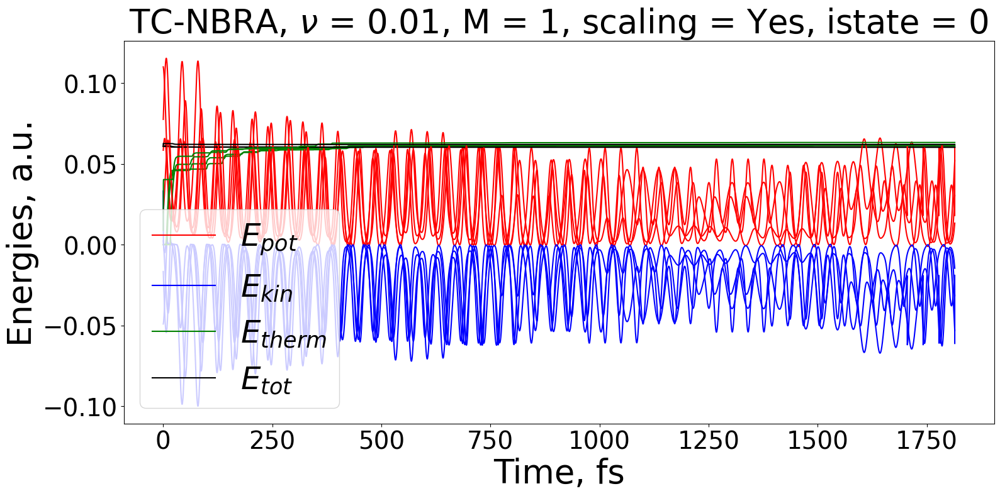

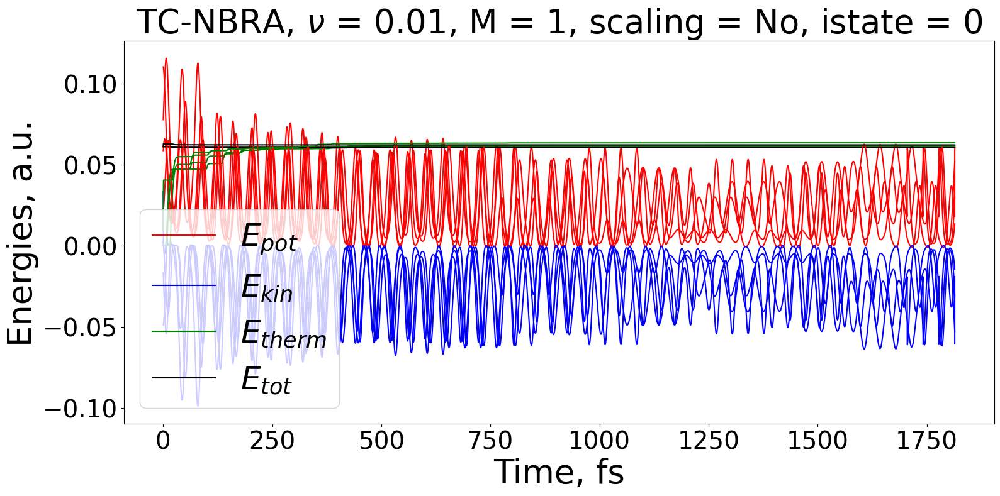

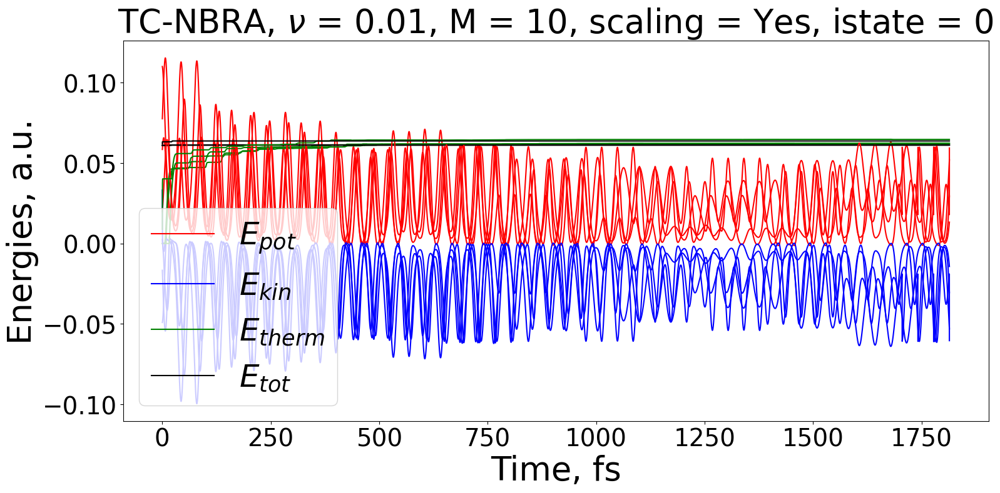

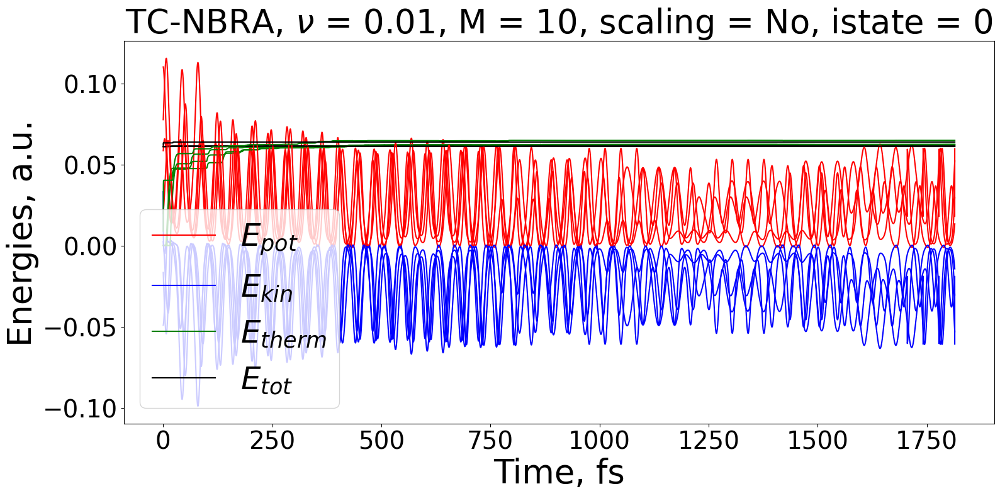

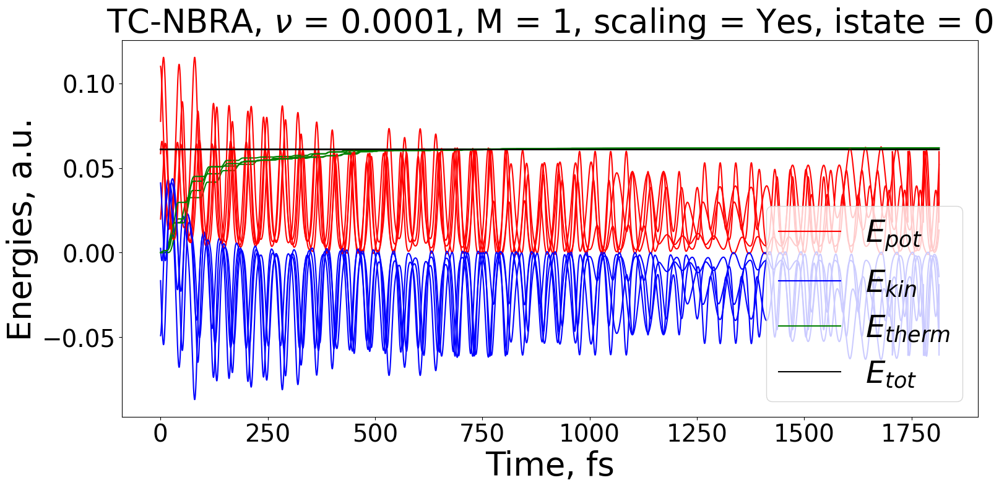

...

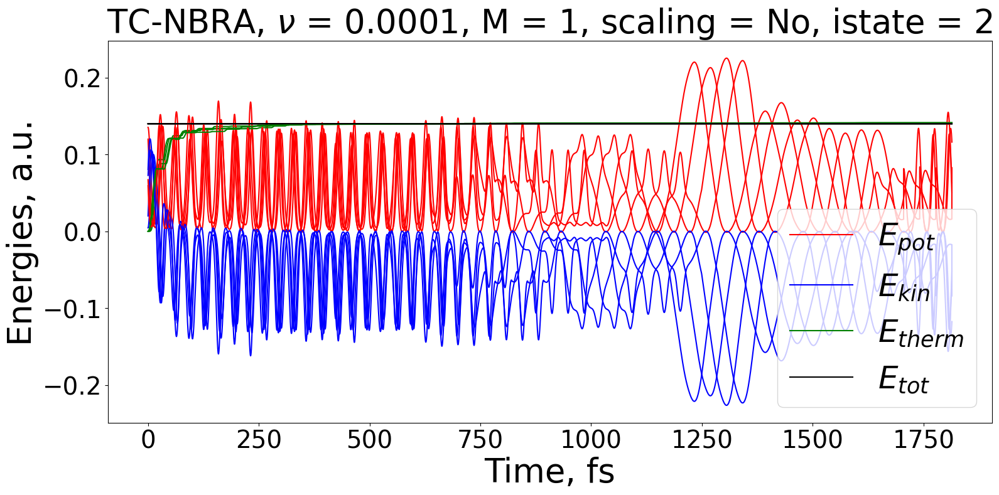

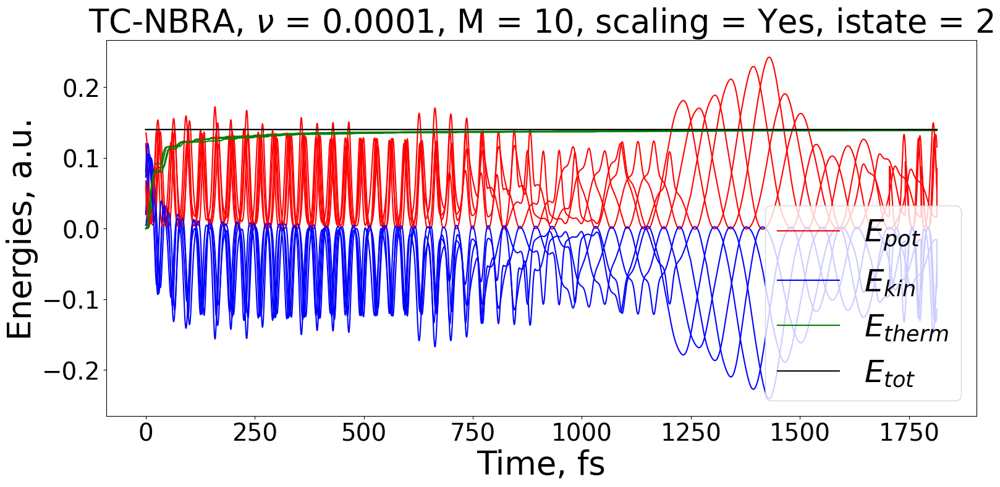

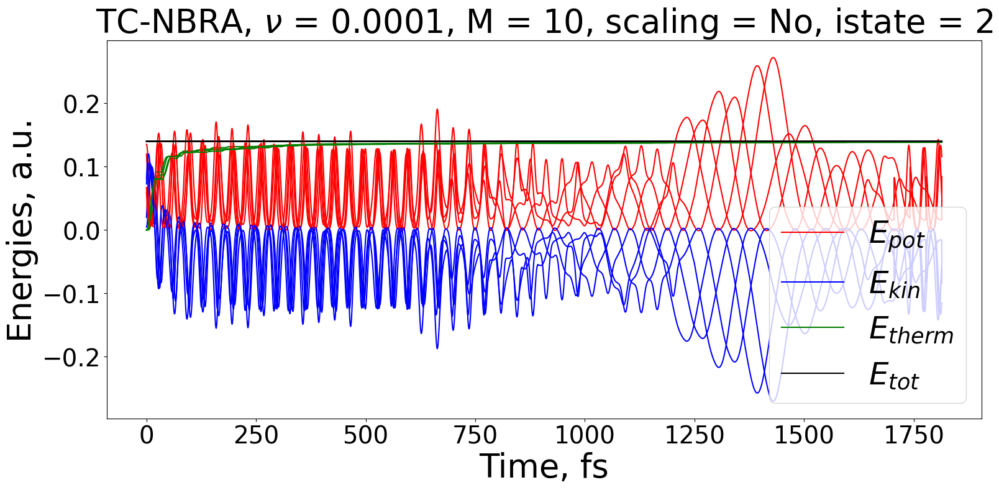

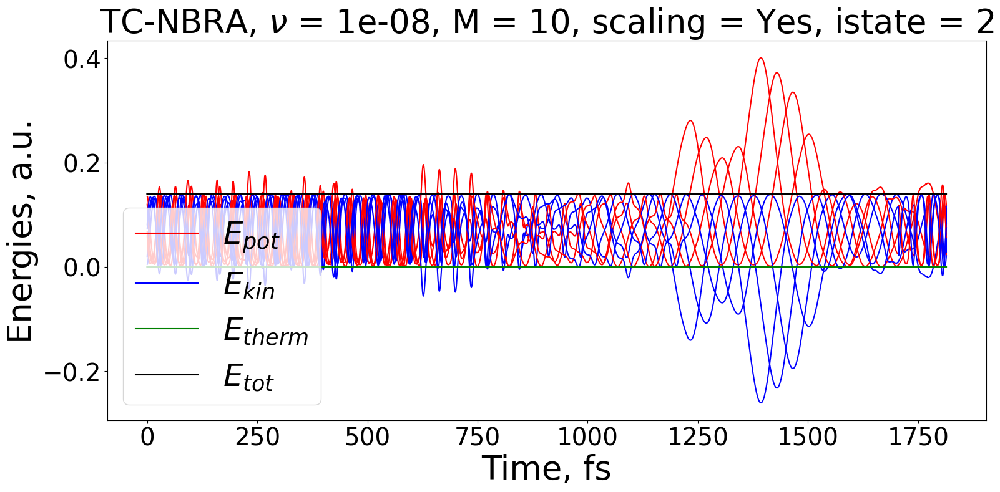

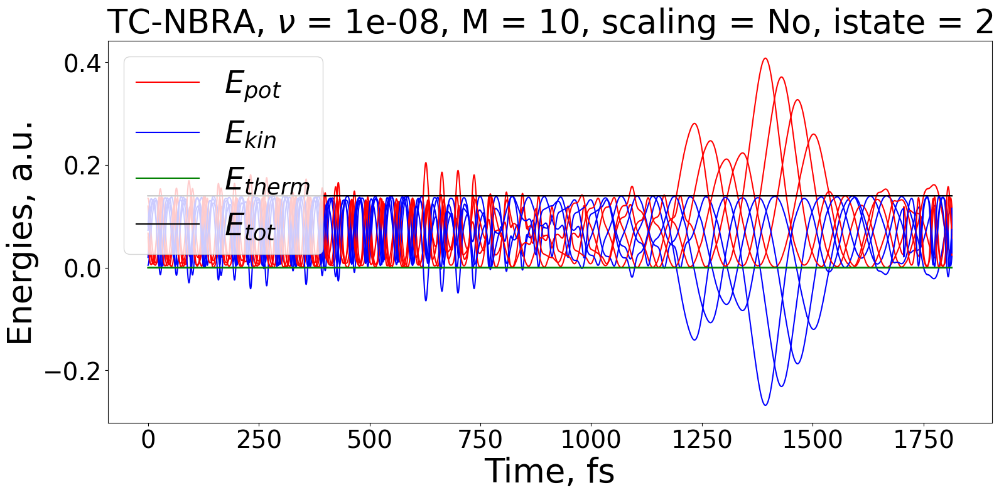

In [4]:
NSTEPS = 15000
ICONDS = list(range(1,1000,300))

plt.rc('axes', titlesize=38)      # fontsize of the axes title
plt.rc('axes', labelsize=38)      # fontsize of the x and y labels
plt.rc('legend', fontsize=36)     # legend fontsize
plt.rc('xtick', labelsize=28)     # fontsize of the tick labels
plt.rc('ytick', labelsize=28)     # fontsize of the tick labels

plt.rc('figure.subplot', left=0.2)
plt.rc('figure.subplot', right=0.95)
plt.rc('figure.subplot', bottom=0.13)
plt.rc('figure.subplot', top=0.88)



labels = []
labels.append( [ ["TC-NBRA"], [1e-2], [1], ["Yes"], [0]])  # 0
labels.append( [ ["TC-NBRA"], [1e-2], [1], ["No"], [0]])   # 1
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["Yes"], [0]]) # 2
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["No"], [0]])  # 3
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["Yes"], [0]])  # 4
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["No"], [0]])   # 5
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["Yes"], [0]]) # 6
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["No"], [0]])  # 7
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["Yes"], [0]]) # 8
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["No"], [0]])  # 9

labels.append( [ ["TC-NBRA"], [1e-2], [1], ["Yes"], [2]])  # 10
labels.append( [ ["TC-NBRA"], [1e-2], [1], ["No"], [2]])   # 11
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["Yes"], [2]]) # 12
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["No"], [2]])  # 13
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["Yes"], [2]])  # 14
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["No"], [2]])   # 15
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["Yes"], [2]]) # 16
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["No"], [2]])  # 17
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["Yes"], [2]]) # 18
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["No"], [2]])  # 19



indx = 0
for istate in [0, 2]:
    for params_opt in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]:

        method = F"FSSH_TC-{istate}-{params_opt}"
        
        plt.figure(num=indx, figsize=(16, 8))
        
        for c, icond in enumerate(ICONDS):
        
            md_time, epot, ekin, etherm = [], [], [], []
            with h5py.File(F"{method}_icond_{icond}/mem_data.hdf", 'r') as F:
                epot = np.array(F['Epot_ave/data'][1:]) 
                ekin = np.array(F['tcnbra_ekin/data'][1:])
                etherm = np.array(F['tcnbra_thermostat_energy/data'][1:])
                md_time = np.array(F['time/data'][1:]) * units.au2fs
                 
            etot = epot + ekin + etherm       
            if c==0:
                plt.plot(md_time, epot, color="red", label="$E_{pot}$")
                plt.plot(md_time, ekin, color="blue", label="$E_{kin}$")
                plt.plot(md_time, etherm, color="green", label="$E_{therm}$")
                plt.plot(md_time, etot, color="black", label="$E_{tot}$")        
            else:
                plt.plot(md_time, epot, color="red")
                plt.plot(md_time, ekin, color="blue")
                plt.plot(md_time, etherm, color="green")
                plt.plot(md_time, etot, color="black")
                
        
        plt.ylabel('Energies, a.u.')
        plt.xlabel('Time, fs')
        
        nu = labels[indx][1][0]
        M = labels[indx][2][0]
        scl = labels[indx][3][0]
        ist = labels[indx][4][0]        
        plt.title(F'TC-NBRA, $\\nu$ = {nu}, M = {M}, scaling = {scl}, istate = {ist}')
            
        plt.legend()
        plt.tight_layout()
        plt.savefig(F'energies-{method}.png')    
        
        indx = indx + 1

## 2. Populations


R2 = 0.97833171804529
R2 = 0.9904301865252944
R2 = 0.9914974642872929
R2 = 0.9925040244336417
The timescales for method FSSH-0: 129.31516414443334+-26.69632370232368 fs, averaged over 4 samples
R2 = 0.9960732893270198
R2 = 0.995723990898349
R2 = 0.9977594645069513
R2 = 0.9972867476109034
The timescales for method FSSH-2: 38.289718584331595+-9.176347807173949 fs, averaged over 4 samples
R2 = 0.9700258136679705
R2 = 0.9816552746002112
R2 = 0.9894123230992717
R2 = 0.9901939329702697
The timescales for method FSSH_TC-0-0: 186.74931015586168+-36.53713510660635 fs, averaged over 4 samples
R2 = 0.9751077499411094
R2 = 0.9937288626772155
R2 = 0.9925806214599792
R2 = 0.9945626847193322
The timescales for method FSSH_TC-0-1: 155.51030348536784+-28.280996663268326 fs, averaged over 4 samples
R2 = 0.9725113761182046
R2 = 0.9814047818636538
R2 = 0.9871118724323752
R2 = 0.9895285493095417
The timescales for method FSSH_TC-0-2: 191.96148249110024+-33.37701110883684 fs, averaged over 4 samples
R2 = 0.

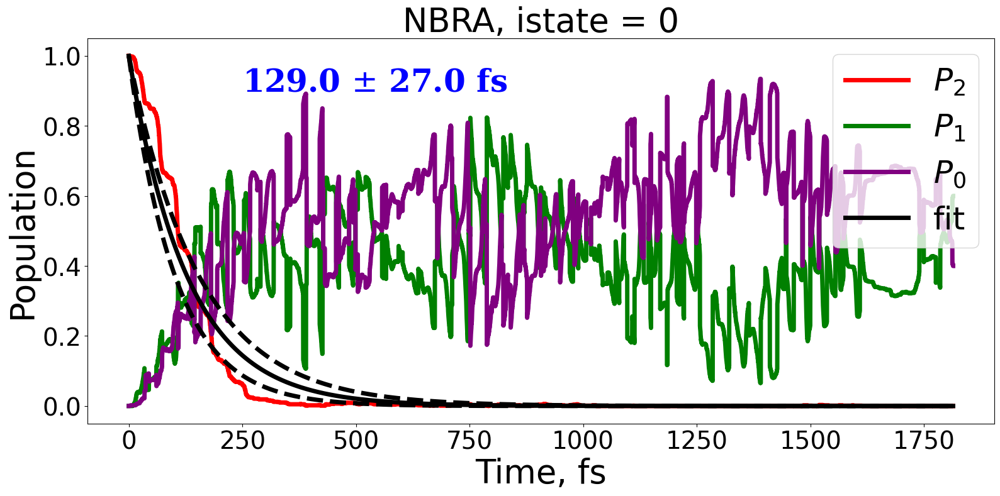

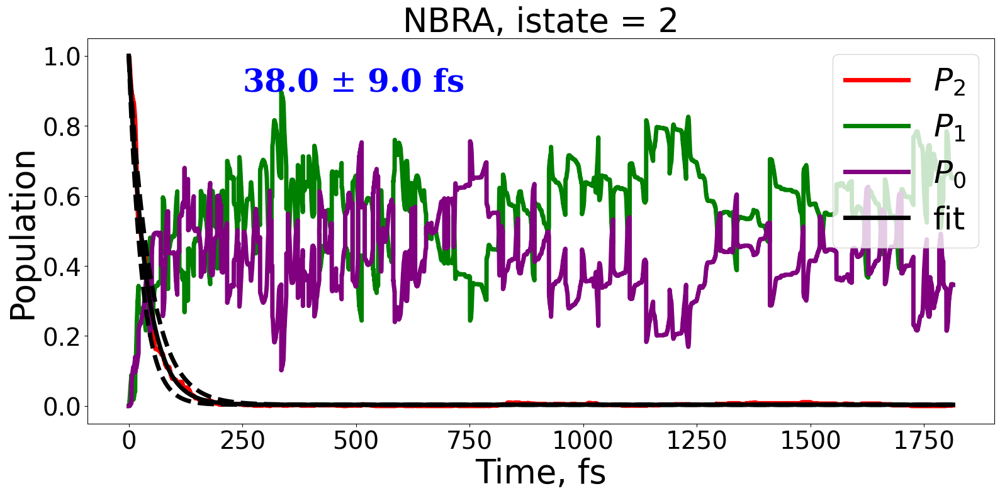

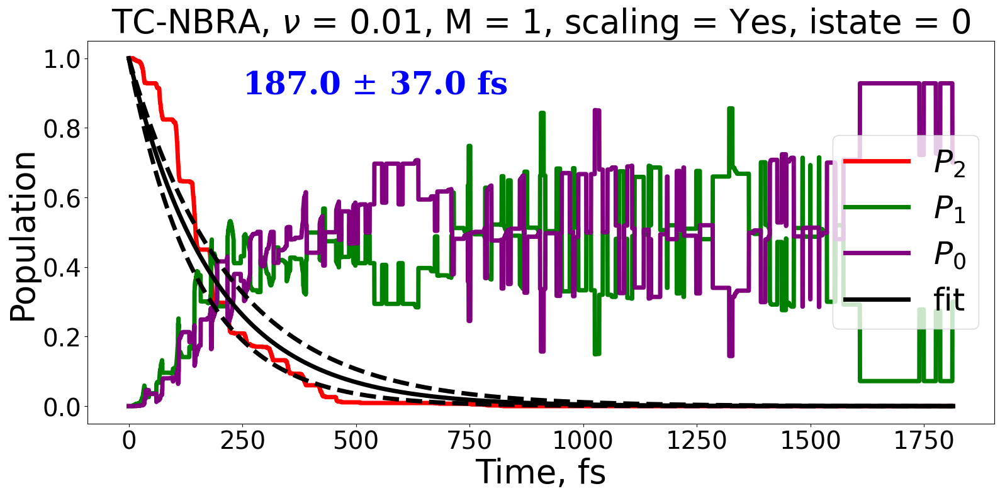

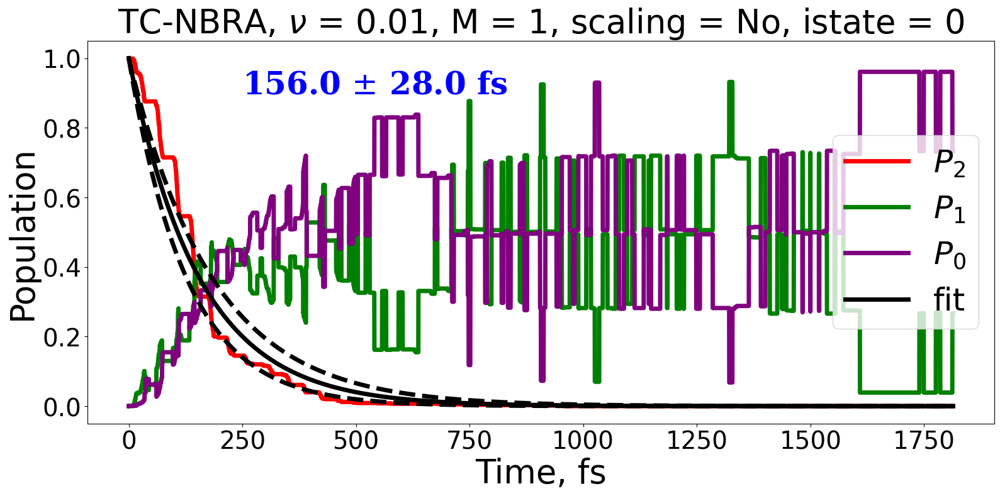

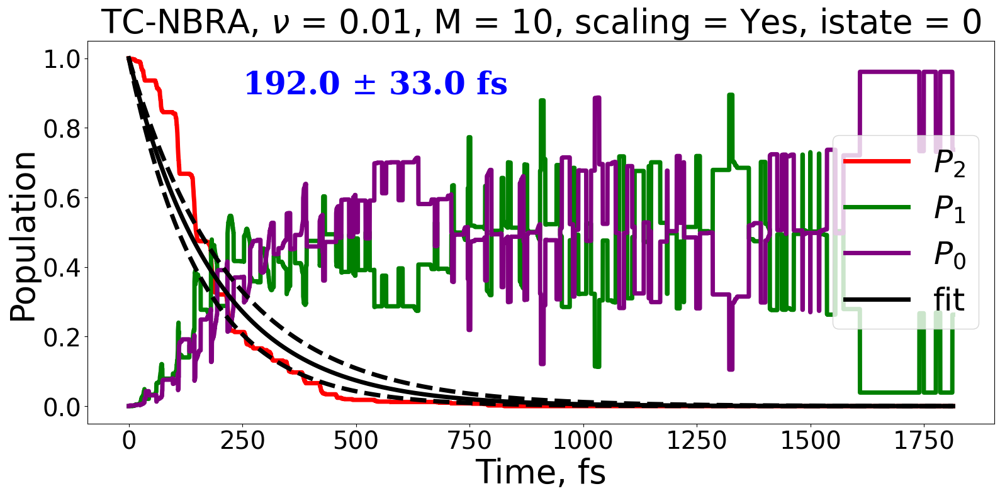

...

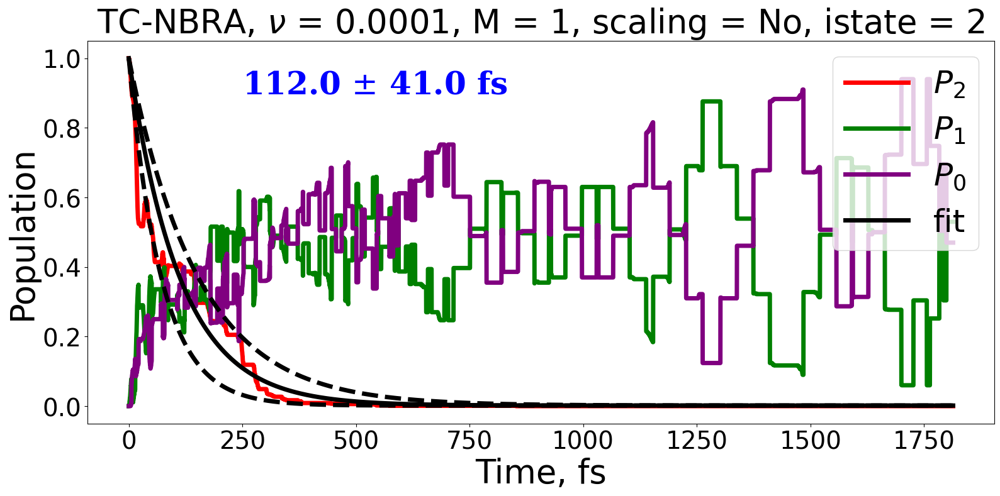

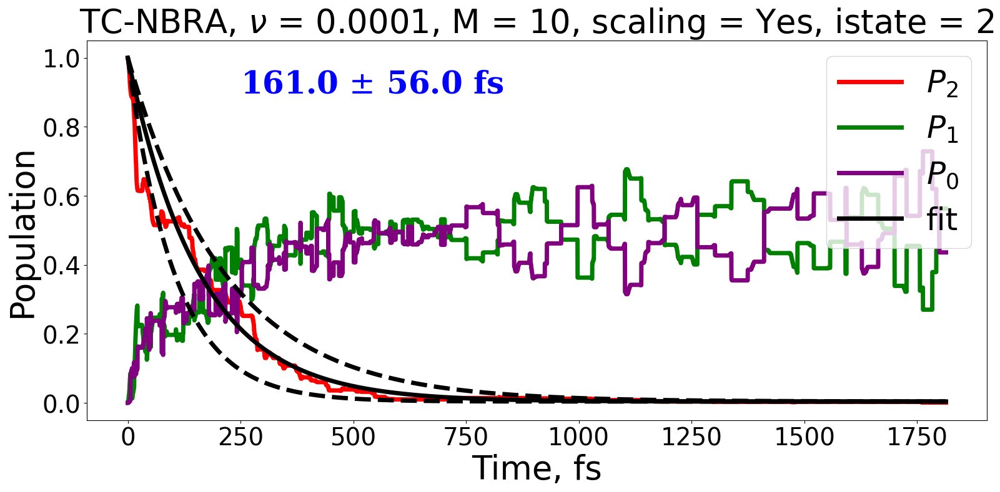

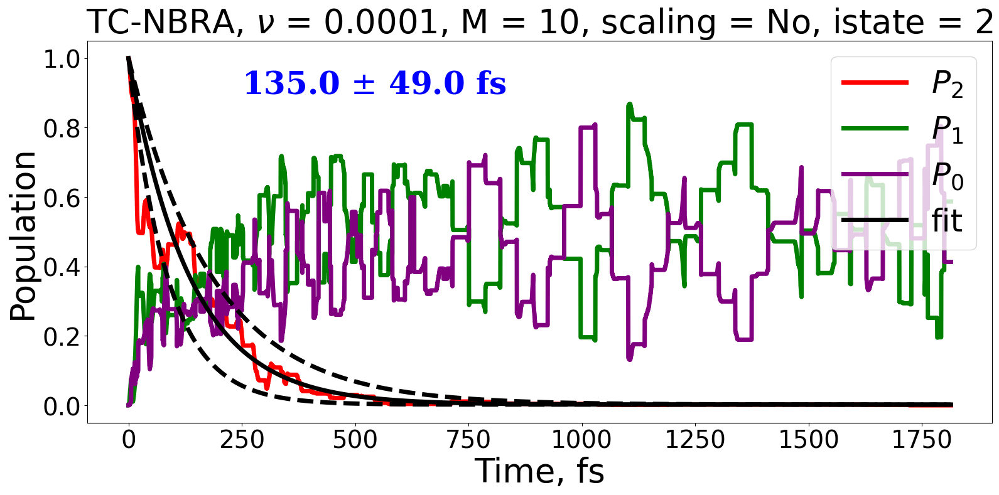

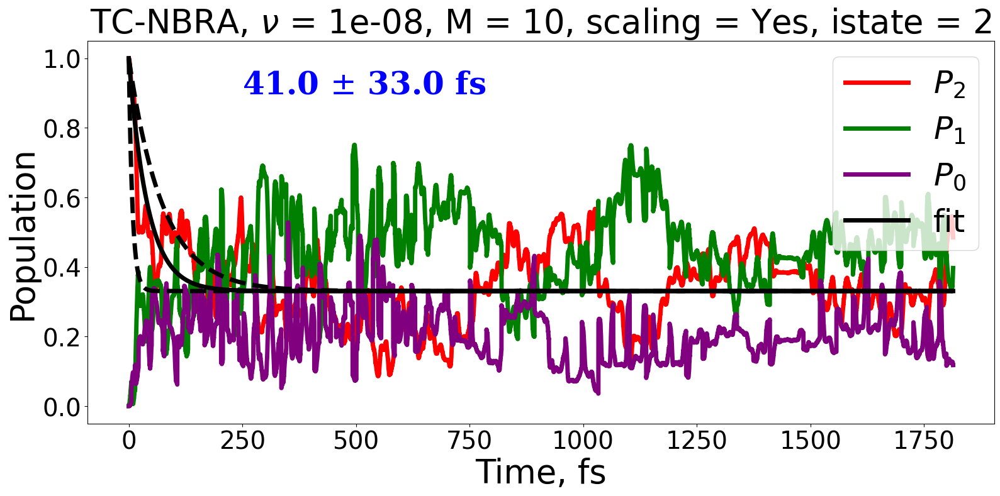

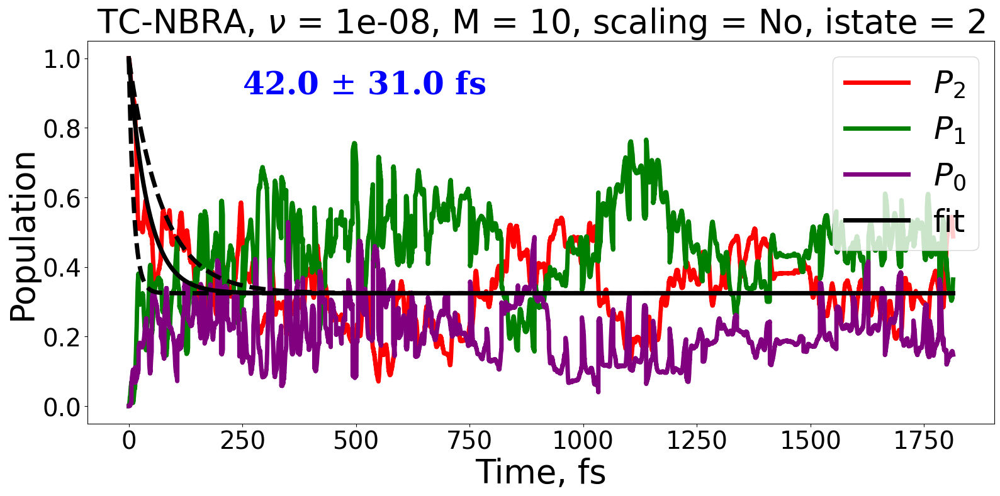

In [8]:
#def exp_funct(t, _x):
#    return np.exp(-np.power(t/_x, 1))

def exp_funct(t, _x, _A):
    return _A + (1-_A) * np.exp(-np.power(t/_x, 1))


labels = []
labels.append( [ ["NBRA"], [None], [None], ["No"], [0]]) # 0  
labels.append( [ ["NBRA"], [None], [None], ["No"], [2]])  # 1

labels.append( [ ["TC-NBRA"], [1e-2], [1], ["Yes"], [0]])  # 2
labels.append( [ ["TC-NBRA"], [1e-2], [1], ["No"], [0]])   # 3
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["Yes"], [0]]) # 4
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["No"], [0]])  # 5
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["Yes"], [0]])  # 6
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["No"], [0]])   # 7
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["Yes"], [0]]) # 8
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["No"], [0]])  # 9
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["Yes"], [0]]) # 10
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["No"], [0]])  # 11

labels.append( [ ["TC-NBRA"], [1e-2], [1], ["Yes"], [2]])  # 12
labels.append( [ ["TC-NBRA"], [1e-2], [1], ["No"], [2]])   # 13
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["Yes"], [2]]) # 14
labels.append( [ ["TC-NBRA"], [1e-2], [10], ["No"], [2]])  # 15
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["Yes"], [2]])  # 16
labels.append( [ ["TC-NBRA"], [1e-4], [1], ["No"], [2]])   # 17
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["Yes"], [2]]) # 18
labels.append( [ ["TC-NBRA"], [1e-4], [10], ["No"], [2]])  # 19
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["Yes"], [2]]) # 20
labels.append( [ ["TC-NBRA"], [1e-8], [10], ["No"], [2]])  # 21



NSTEPS = 15000
ICONDS = list(range(1,1000,300))

methods = ["FSSH-0", "FSSH-2"]

for istate in [0, 2]:
    for params_opt in [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]:

        method = F"FSSH_TC-{istate}-{params_opt}"
        methods.append(method)



plt.rc('axes', titlesize=38)      # fontsize of the axes title
plt.rc('axes', labelsize=38)      # fontsize of the x and y labels
plt.rc('legend', fontsize=36)     # legend fontsize
plt.rc('xtick', labelsize=28)     # fontsize of the tick labels
plt.rc('ytick', labelsize=28)     # fontsize of the tick labels

plt.rc('figure.subplot', left=0.2)
plt.rc('figure.subplot', right=0.95)
plt.rc('figure.subplot', bottom=0.13)
plt.rc('figure.subplot', top=0.88)

font = {'family': 'serif',
        'color':  'blue',
        'weight': 'bold',
        'size': 36,
        }

    
for c, method in enumerate(methods):
    
    plt.figure(num=c, figsize=(16, 8) )
    
    
    taus, As = [], []
    P2, P1, P0 = [], [], []
    for icond in ICONDS:        
        sh_pop0, sh_pop1, sh_pop2, se_pop, md_time = [], [], [], [], []
        with h5py.File(F"{method}_icond_{icond}/mem_data.hdf", 'r') as F:
            sh_pop0 = np.array(F['sh_pop_adi/data'][:,0]) 
            sh_pop1 = np.array(F['sh_pop_adi/data'][:,1])
            sh_pop2 = np.array(F['sh_pop_adi/data'][:,2])
            se_pop = np.array(F['se_pop_adi/data'][:,istate]) 
            md_time = np.array(F['time/data'][:]) * units.au2fs

        #plt.plot(md_time, sh_pop2, color="red")
        #plt.plot(md_time, sh_pop1, color='green')
        #plt.plot(md_time, sh_pop0, color='purple')  
        
        popt, pcov = curve_fit( exp_funct, md_time, sh_pop2, bounds=([0.0, 0.0],[np.inf, 1.0]))
        _tau = popt[0]
        _A = popt[1]
        
        # Computing the R-squared
        residuals  = sh_pop2 - exp_funct(md_time, *popt)
        ss_res     = np.sum(residuals**2)
        ss_tot     = np.sum((sh_pop2 - np.mean(sh_pop0))**2)
        r_squared  = 1.0 - (ss_res / ss_tot)        
        print(F"R2 = {r_squared}")
        
        if r_squared>=0.0:
            taus.append(_tau)
            As.append(_A)
            
        P2.append(sh_pop2)
        P1.append(sh_pop1)
        P0.append(sh_pop0)
    
    P2 = np.array(P2)
    P1 = np.array(P1)
    P0 = np.array(P0)
    
    plt.ylabel('Population')
    plt.xlabel('Time, fs')
    if c in [0, 1]:
        ist = labels[c][4][0]
        plt.title(F'NBRA, istate = {ist}')
    else:
        nu = labels[c][1][0]
        M = labels[c][2][0]
        scl = labels[c][3][0]
        ist = labels[c][4][0]
        plt.title(F'TC-NBRA, $\\nu$ = {nu}, M = {M}, scaling = {scl}, istate = {ist}')

    
    aveP2 = np.average(P2, axis=0)
    aveP1 = np.average(P1, axis=0)
    aveP0 = np.average(P0, axis=0)
        
    plt.plot(md_time, aveP2, color="red", label="$P_2$", lw=5)
    plt.plot(md_time, aveP1, color='green', label="$P_1$", lw=5)
    plt.plot(md_time, aveP0, color='purple', label="$P_0$", lw=5)    
    
    taus = np.array(taus)    
    ave_tau = np.average(taus)    
    s = np.std(taus)
    Z = 1.96
    N = taus.shape[0]
    error_bar = Z*s/np.sqrt(N)
    
    As = np.array(As)
    ave_A = np.average(As)
    
    print(F'The timescales for method {method}: {ave_tau}+-{error_bar} fs, averaged over {len(taus)} samples')    
    
    plt.plot(md_time, exp_funct(md_time, ave_tau-error_bar, ave_A), ls='--', color="black", lw=5)
    plt.plot(md_time, exp_funct(md_time, ave_tau, ave_A), ls='-',  color="black", label="fit", lw=5)
    plt.plot(md_time, exp_funct(md_time, ave_tau+error_bar, ave_A), ls='--', color="black", lw=5)
    
    plt.legend()
    plt.text(250, 0.9, F"{round(ave_tau,0)} $\pm$ {round(error_bar, 0)} fs", fontdict=font)
    plt.tight_layout()
    plt.savefig(F'dynamics-{method}.png')



## 3. Non-NBRA data

R2 = 0.06014548406246367
The timescales for method DATA-model4-method4-icond0: 1.3843665393545312e-07+-0.0 fs, averaged over 1 samples
R2 = 0.185362624791633
The timescales for method DATA-model4-method4-icond2: 35.81118290161087+-0.0 fs, averaged over 1 samples


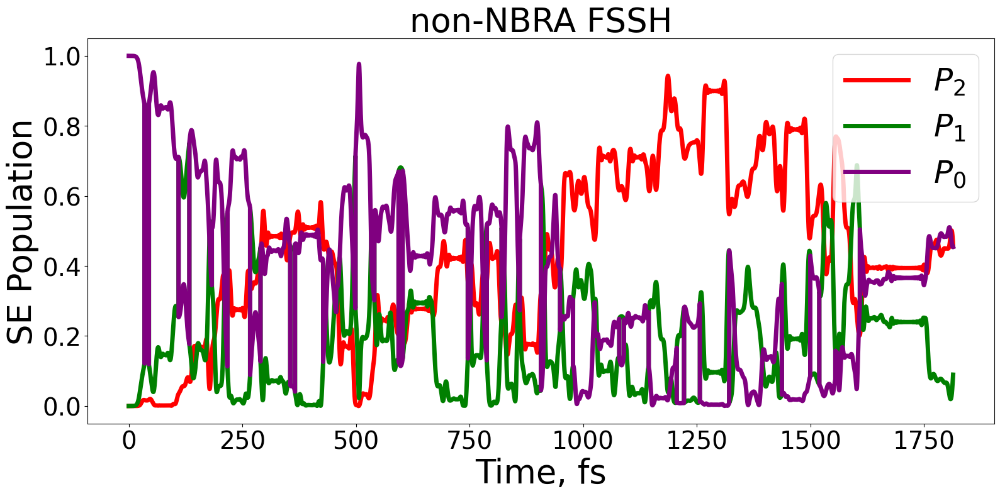

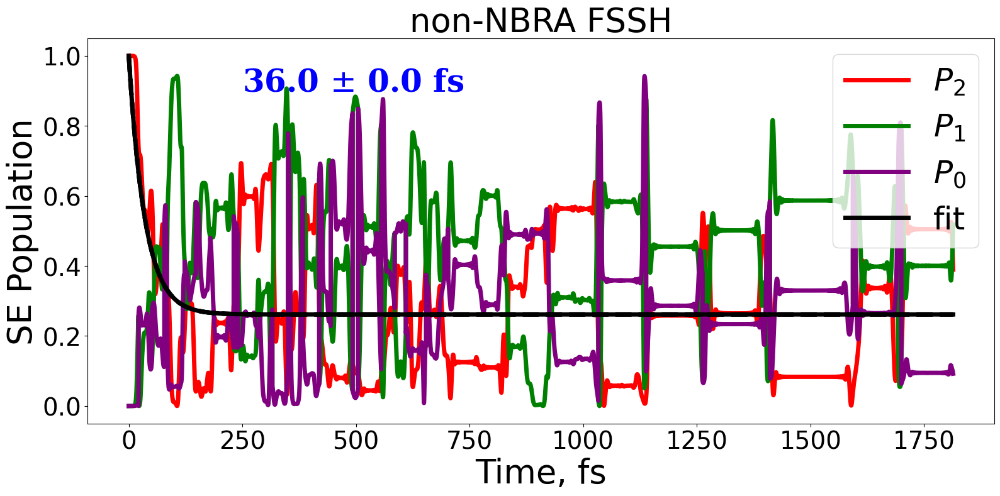

In [9]:
def exp_funct(t, _x, _A):
    return _A + (1-_A) * np.exp(-np.power(t/_x, 1))


methods = ["DATA-model4-method4-icond0", "DATA-model4-method4-icond2"]

plt.rc('axes', titlesize=38)      # fontsize of the axes title
plt.rc('axes', labelsize=38)      # fontsize of the x and y labels
plt.rc('legend', fontsize=36)     # legend fontsize
plt.rc('xtick', labelsize=28)     # fontsize of the tick labels
plt.rc('ytick', labelsize=28)     # fontsize of the tick labels

plt.rc('figure.subplot', left=0.2)
plt.rc('figure.subplot', right=0.95)
plt.rc('figure.subplot', bottom=0.13)
plt.rc('figure.subplot', top=0.88)

font = {'family': 'serif',
        'color':  'blue',
        'weight': 'bold',
        'size': 36,
        }

    
for c, method in enumerate(methods):
    
    plt.figure(num=c, figsize=(16, 8) )
    
    
    taus, As = [], []
    P2, P1, P0 = [], [], []
    for icond in [0]:        
        sh_pop0, sh_pop1, sh_pop2, se_pop, md_time = [], [], [], [], []
        with h5py.File(F"{method}/mem_data.hdf", 'r') as F:
            sh_pop0 = np.array(F['se_pop_adi/data'][:,0]) 
            sh_pop1 = np.array(F['se_pop_adi/data'][:,1])
            sh_pop2 = np.array(F['se_pop_adi/data'][:,2])
            se_pop = np.array(F['se_pop_adi/data'][:,istate]) 
            md_time = np.array(F['time/data'][:]) * units.au2fs

        #plt.plot(md_time, sh_pop2, color="red")
        #plt.plot(md_time, sh_pop1, color='green')
        #plt.plot(md_time, sh_pop0, color='purple')  
        
        
        popt, pcov = curve_fit( exp_funct, md_time, sh_pop2, bounds=([0.0, 0.0],[np.inf, 1.0]))
        _tau = popt[0]
        _A = popt[1]
        
        # Computing the R-squared
        residuals  = sh_pop2 - exp_funct(md_time, *popt)
        ss_res     = np.sum(residuals**2)
        ss_tot     = np.sum((sh_pop2 - np.mean(sh_pop0))**2)
        r_squared  = 1.0 - (ss_res / ss_tot)        
        print(F"R2 = {r_squared}")
        
        if r_squared>=0.0:
            taus.append(_tau)
            As.append(_A)
            
        P2.append(sh_pop2)
        P1.append(sh_pop1)
        P0.append(sh_pop0)
    
    P2 = np.array(P2)
    P1 = np.array(P1)
    P0 = np.array(P0)
    
    plt.ylabel('SE Population')
    plt.xlabel('Time, fs')
    plt.title(F'non-NBRA FSSH')
    
    aveP2 = np.average(P2, axis=0)
    aveP1 = np.average(P1, axis=0)
    aveP0 = np.average(P0, axis=0)
        
    plt.plot(md_time, aveP2, color="red", label="$P_2$", lw=5)
    plt.plot(md_time, aveP1, color='green', label="$P_1$", lw=5)
    plt.plot(md_time, aveP0, color='purple', label="$P_0$", lw=5)    
    
    taus = np.array(taus)    
    ave_tau = np.average(taus)    
    s = np.std(taus)
    Z = 1.96
    N = taus.shape[0]
    error_bar = Z*s/np.sqrt(N)
    
    As = np.array(As)
    ave_A = np.average(As)
    
    print(F'The timescales for method {method}: {ave_tau}+-{error_bar} fs, averaged over {len(taus)} samples')    
    if c==1:
        plt.plot(md_time, exp_funct(md_time, ave_tau-error_bar, ave_A), ls='--', color="black", lw=5)
        plt.plot(md_time, exp_funct(md_time, ave_tau, ave_A), ls='-',  color="black", label="fit", lw=5)
        plt.plot(md_time, exp_funct(md_time, ave_tau+error_bar, ave_A), ls='--', color="black", lw=5)
        plt.text(250, 0.9, F"{round(ave_tau,0)} $\pm$ {round(error_bar, 0)} fs", fontdict=font)    
    plt.legend()

    plt.tight_layout()
    plt.savefig(F'dynamics-{method}.png')



In [ ]:
methods = ["DATA-model4-method4-icond0", "DATA-model4-method4-icond2"]

plt.rc('axes', titlesize=38)      # fontsize of the axes title
plt.rc('axes', labelsize=38)      # fontsize of the x and y labels
plt.rc('legend', fontsize=36)     # legend fontsize
plt.rc('xtick', labelsize=28)     # fontsize of the tick labels
plt.rc('ytick', labelsize=28)     # fontsize of the tick labels

plt.rc('figure.subplot', left=0.2)
plt.rc('figure.subplot', right=0.95)
plt.rc('figure.subplot', bottom=0.13)
plt.rc('figure.subplot', top=0.88)

font = {'family': 'serif',
        'color':  'blue',
        'weight': 'bold',
        'size': 36,
        }

    
for c, method in enumerate(methods):
    
    plt.figure(num=c, figsize=(16, 8) )
        
    with h5py.File(F"{method}/mem_data.hdf", 'r') as F:
        sh_pop0 = np.array(F['se_pop_adi/data'][:,0]) 
        sh_pop1 = np.array(F['se_pop_adi/data'][:,1])
        sh_pop2 = np.array(F['se_pop_adi/data'][:,2])
        se_pop = np.array(F['se_pop_adi/data'][:,istate]) 
        md_time = np.array(F['time/data'][:]) * units.au2fs

    plt.ylabel('SE Population')
    plt.xlabel('Time, fs')
    plt.title(F'non-NBRA FSSH')
    
    plt.plot(md_time, aveP2, color="red", label="$P_2$", lw=5)
    plt.plot(md_time, aveP1, color='green', label="$P_1$", lw=5)
    plt.plot(md_time, aveP0, color='purple', label="$P_0$", lw=5)    
    
    plt.legend()
    plt.tight_layout()
    plt.savefig(F'dynamics-{method}.png')



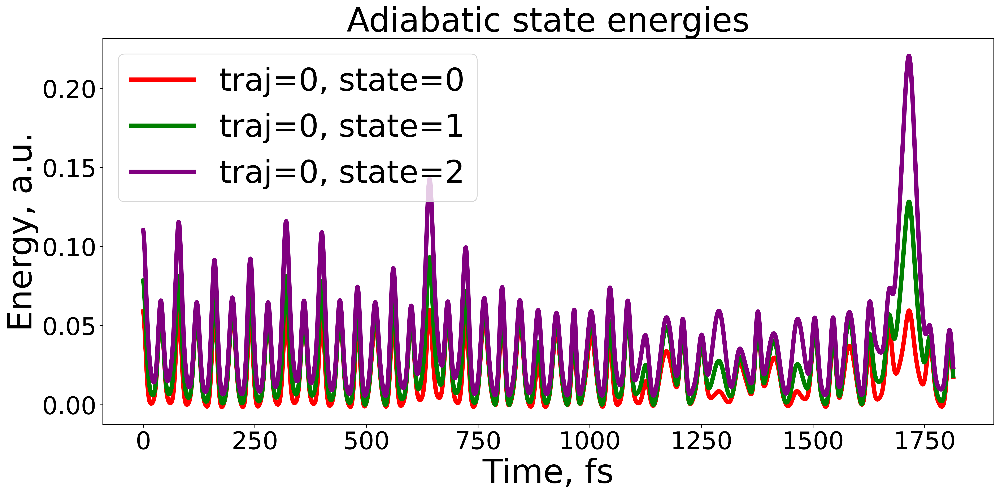

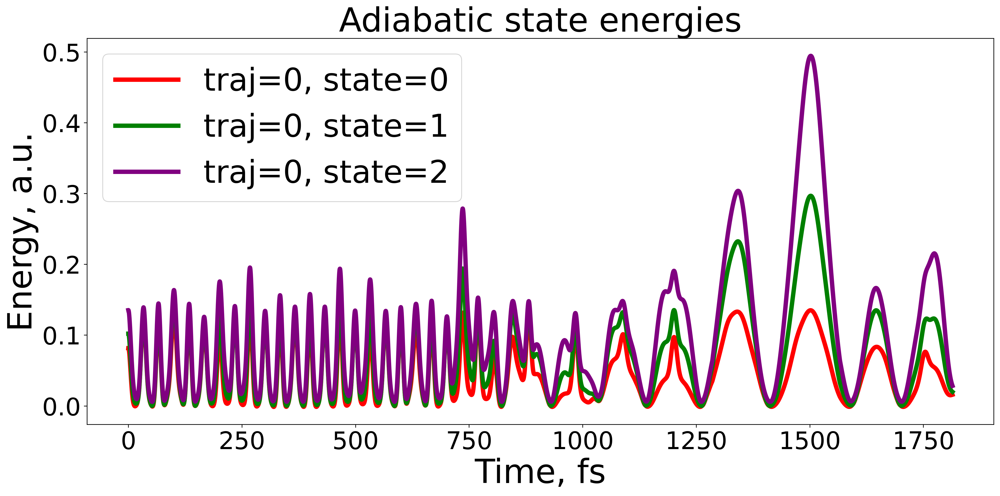

In [25]:
plot_params_ = {  "prefix":"out", "filename":"mem_data.hdf", "output_level":3,
                        "which_trajectories":[0], "which_dofs":[0],
                        "which_adi_states":[0,1,2], "which_dia_states":[],
                        "which_energies":["kinetic", "potential", "total"],
                        "colors":["red", "green", "purple"], 
                        "clrs_index":[0, 1, 2],
                        "save_figures":1, "do_show":1, "dpi":300, "figsize":(16, 8),
                        "axes_fontsize":(28, 28), "axes_label_fontsize":(38,38),
                        "legend_fontsize":36, "title_fontsize":38,
                        "linewidth":5,
                        "frameon":True,
                        "xlim":None, "ylim":None,
                        "what_to_plot":["energies", "energy_fluctuations", 
                                        "traj_resolved_adiabatic_ham", "traj_resolved_diabatic_ham",
                                        "coordinates", "phase_space",
                                        "sh_pop", "se_pop_adi", "se_pop_dia",
                                        "sh_pop_raw", "se_pop_adi_raw", "se_pop_dia_raw",
                                        "time_overlaps", "projectors", "basis_transform"
                                       ],
                        "no_label":0   
               }

with h5py.File("DATA-model4-method4-icond0/mem_data.hdf", 'r') as f:
    ham_property_type = "hvib_adi" 
    plt.figure(num=100, figsize=(16, 8), dpi=300, edgecolor='black', frameon=True)    
    tsh_plot.add_trajectory_resolved_ham_property(plt, f, plot_params_, ham_property_type)
    plt.savefig("DATA-model4-method4-icond0-Ham.png")
    
with h5py.File("DATA-model4-method4-icond2/mem_data.hdf", 'r') as f:
    ham_property_type = "hvib_adi" 
    plt.figure(num=101, figsize=(16, 8), dpi=300, edgecolor='black', frameon=True)    
    tsh_plot.add_trajectory_resolved_ham_property(plt, f, plot_params_, ham_property_type)
    plt.savefig("DATA-model4-method4-icond2-Ham.png")

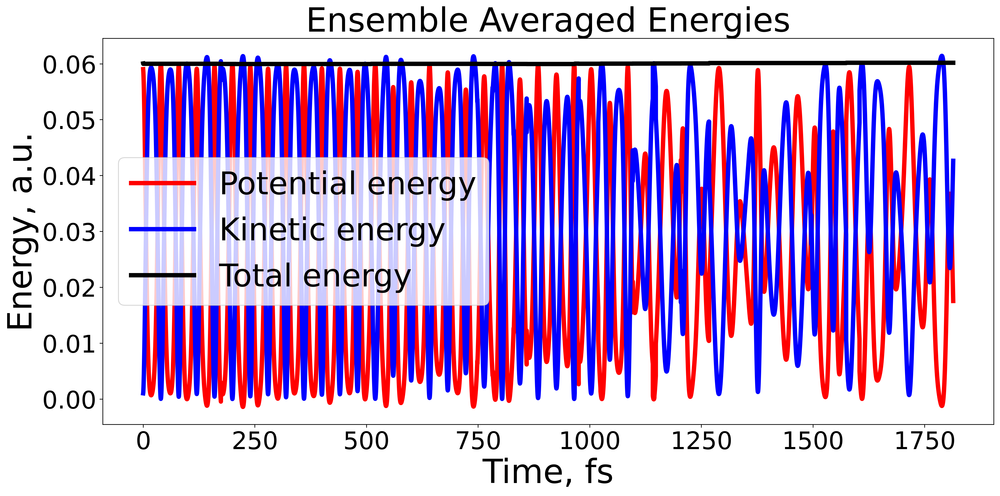

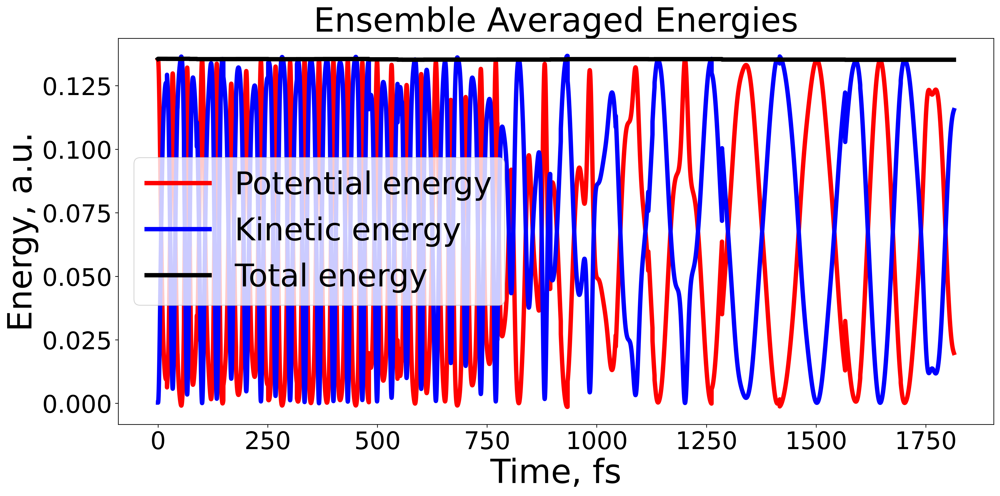

In [28]:
plot_params_.update({ "colors": ["red", "blue", "black"]} )

with h5py.File("DATA-model4-method4-icond0/mem_data.hdf", 'r') as f:    
    plt.figure(num=200, figsize=(16, 8), dpi=300, edgecolor='black', frameon=True)    
    tsh_plot.add_energies(plt, f, plot_params_, "energies")
    plt.savefig("DATA-model4-method4-icond0-energies.png")
    
with h5py.File("DATA-model4-method4-icond2/mem_data.hdf", 'r') as f:    
    plt.figure(num=201, figsize=(16, 8), dpi=300, edgecolor='black', frameon=True)    
    tsh_plot.add_energies(plt, f, plot_params_, "energies")
    plt.savefig("DATA-model4-method4-icond2-energies.png")

## 4. PES scans

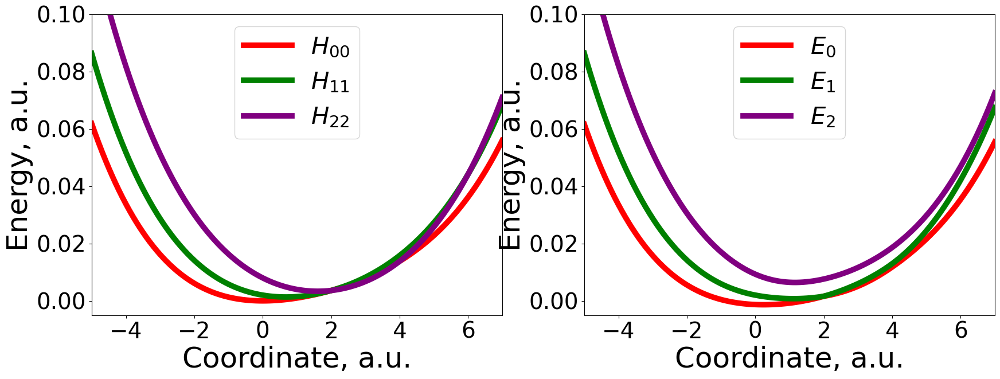

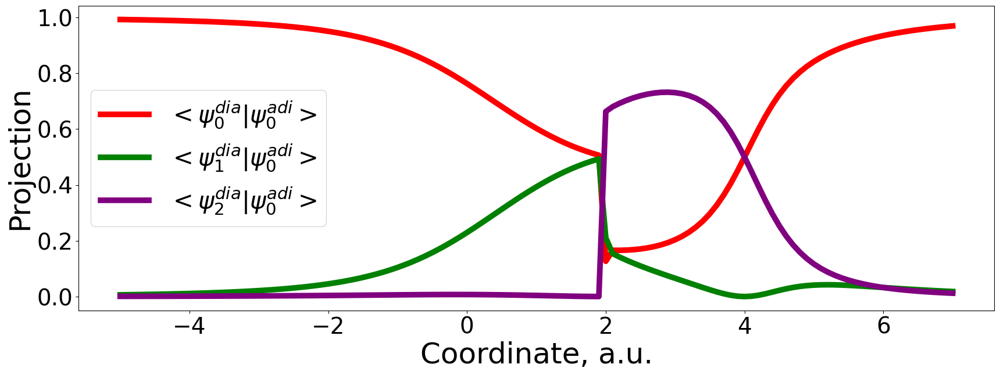

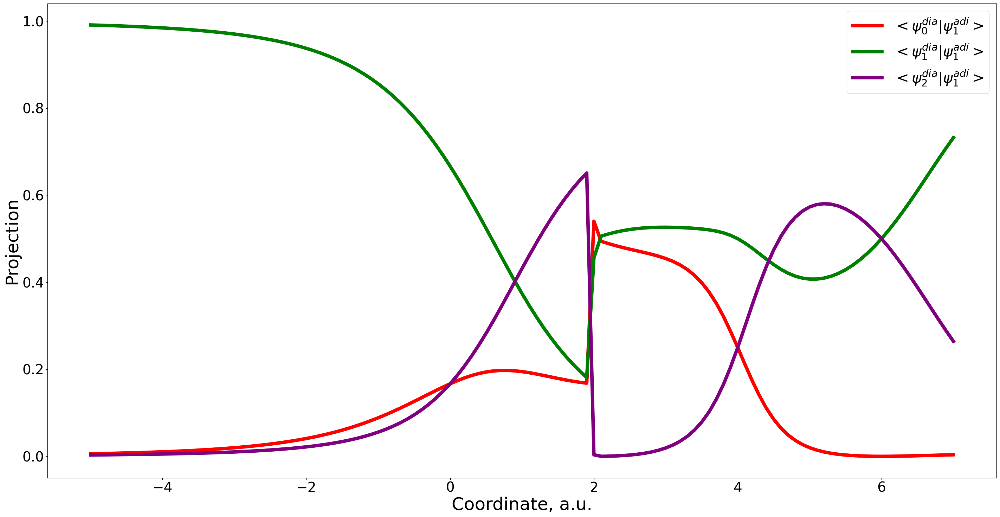

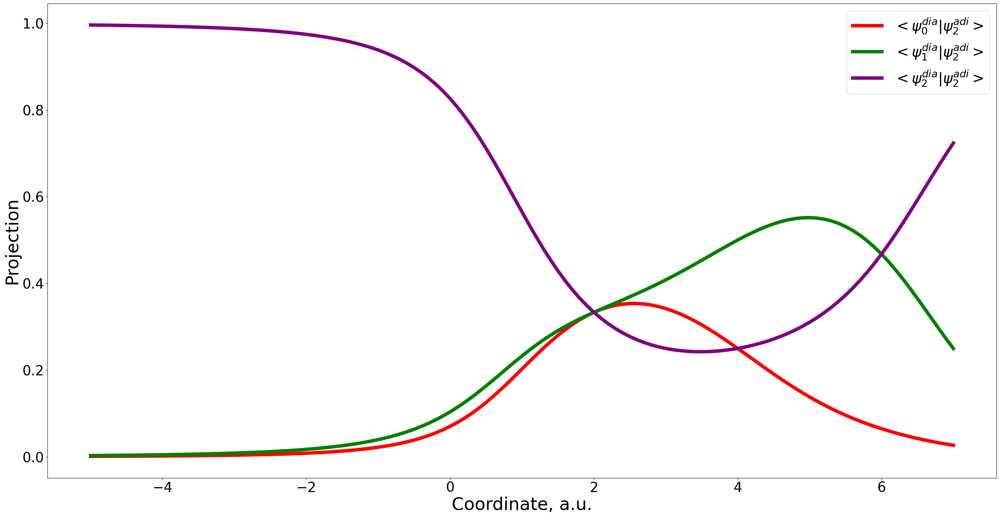

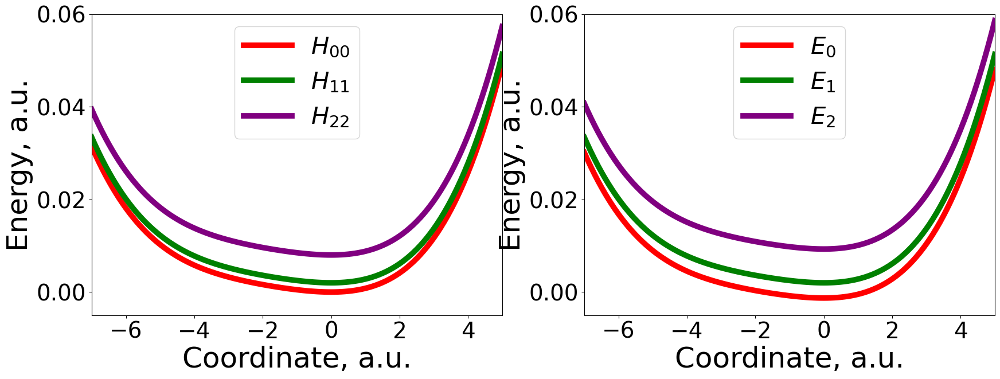

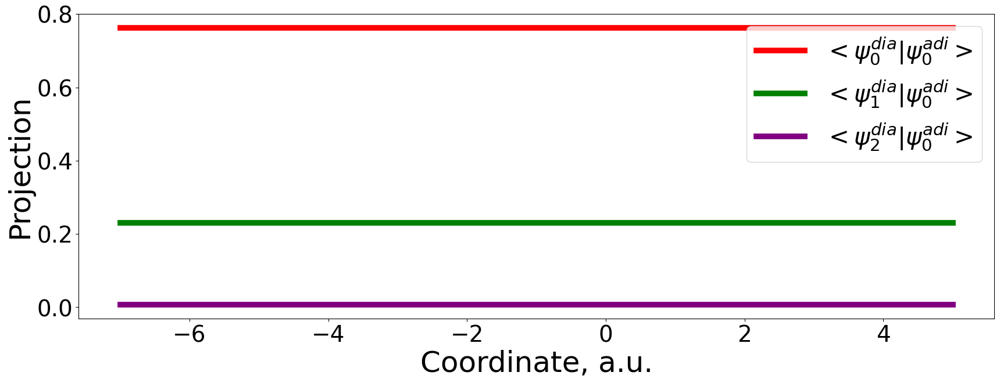

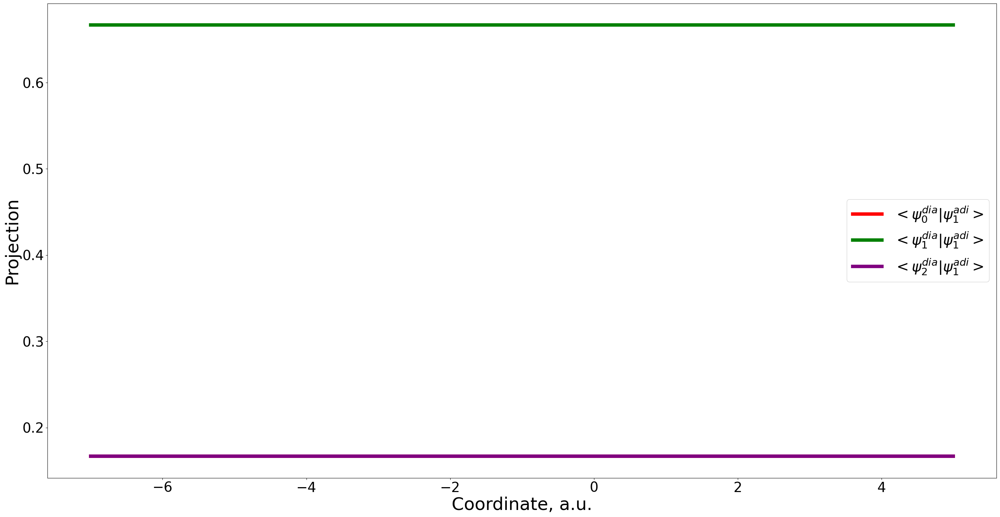

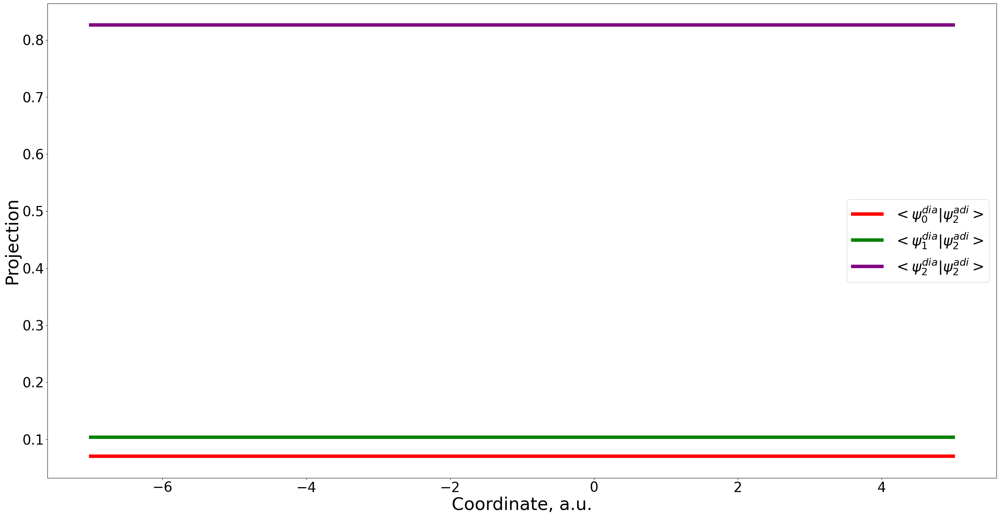

In [75]:
# ## 1. Model Hamiltonians and parameters sets
def compute_model(q, params, full_id):
    model = params["model"]
    res = None

    if model==1:        
        res = Holstein.Holstein2(q, params, full_id) 
    elif model==2:
        res = Tully.chain_potential(q, params, full_id)
    else:
        pass #res = compute_model_nbra_files(q, params, full_id)            

    return res

couplings = [  [ 0.0000, 0.002, 0.002 ],
               [ 0.002, 0.0000, 0.002 ],
               [ 0.002, 0.002, 0.0000 ] 
            ]
model_params5 = {"model":2, "model0":2, "nstates":3, "timestep":0, "icond":0,
                 "E_n":[0.0, 0.001, 0.002], "x_n":[0.0, 1.0, 2.0], "k_n":[0.001, 0.002, 0.003],
                 "V":couplings,  "U0":0.01      }
                    
# Let's visualize these 5 models. Also refer to another tutorial for a more detailed description of the `plot_surfaces` function.
# Common setups
plot_params = {"figsize":[21, 7], "titlesize":10, "labelsize":36, "fontsize": 30, "xticksize":28, "yticksize":28,
               "colors": ["red", "green", "purple"], "clrs_index": [0, 1, 2, 0, 1, 2],
               "prefix":"case0", "save_figures":1, "do_show":1,
               "plotting_option":0, "nac_idof":0, "show_nac_abs":1,
               "xlim":[-5.0, 7], "ylim":[-0.005, 0.1 ] }

                
all_coords = [0.0, 0.0] #, 0.0, 0.0, 0.0]
ndof = len(all_coords)
scan_coord = 0
dynamics_plotting.plot_surfaces(compute_model, [ model_params5 ], [0,1,2], -5, 7.0, 0.1, plot_params, ndof, scan_coord, all_coords)

plot_params.update({"prefix":"case1", "xlim":[-7.0, 5], "ylim":[-0.005, 0.06]  } )
scan_coord = 1
dynamics_plotting.plot_surfaces(compute_model, [ model_params5 ], [0,1,2], -7, 5.0, 0.1, plot_params, ndof, scan_coord, all_coords)
